In [1]:
import pandas as pd
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as pyplot
from pandas_profiling import ProfileReport
import io
#!pip install -U pandas-profiling

#upload colab file
#from google.colab import files
#uploaded = files.upload()
#Use drive file
from google.colab import drive
drive.mount('/content/gdrive') #Mount MachineLearning

#Read local file
import os
for dirname, _, filenames in os.walk('../data/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))




Mounted at /content/gdrive


In [26]:
tweet_data = pd.read_csv('/content/gdrive/MyDrive/MachineLearning/tweet_data.csv') #Read local data
#tweet_data = pd.read_csv('./gdrive/MyDrive/MachineLearning/tweet_data.csv') #Read data del drive
#tweet_data = pd.read_csv(io.BytesIO(uploaded['tweet_data.csv'])) #colab
tweet_data.head()

,screen_name,friends_count,tweets_count,linkedin,snapchat,instagram,facebook,followers_count,favourites_count,qtyMentions,qtyHashtags,qtyUrls,qtyEmojis,qtyUppercase,profile_pic_gender,tweets,age
0,ezequielreal10,659,190,0,0,0,0,262,1611,0.09,0.04,0.00,2.05,4.18,0,18 del compañero 😌🎉😉. salio algo de play 3🔛😊....,10-17
1,caamilachaparro,1559,33525,0,0,0,0,2990,15112,0.56,0.00,0.11,0.73,2.00,2,se fueron las otras así que vuelvo jajajaja. ...,18-24
2,crisalonsofran,2120,24051,0,0,0,0,2160,2377,0.82,0.26,0.54,0.31,2.98,2,"¡buen día mundo! ¡buenas noches mundo! ""si no ...",35-49
3,jluisfoglia,150,4157,0,0,0,0,98,1128,0.91,0.09,0.21,0.02,23.69,1,cambio juez: sale un bueno para nada y entra ...,10-17
4,maiikoldadamia,131,1096,0,0,0,0,189,849,0.20,0.00,0.00,0.75,3.08,1,"creo que ya entre como 20 veces a wsp, a tw y ...",10-17


In [3]:
tweet_data.columns

Index(['screen_name', 'friends_count', 'tweets_count', 'linkedin', 'snapchat',
       'instagram', 'facebook', 'followers_count', 'favourites_count',
       'qtyMentions', 'qtyHashtags', 'qtyUrls', 'qtyEmojis', 'qtyUppercase',
       'profile_pic_gender', 'tweets', 'age'],
      dtype='object')

In [27]:
# Convertimos age a variables categoricas.
tweet_data["age"] = tweet_data["age"].map({"10-17":0, "18-24":1, "25-34" : 2 , "35-49":3, "50-xx":4})
tweet_data["age"] = tweet_data["age"].astype(int)
tweet_data.head()

,screen_name,friends_count,tweets_count,linkedin,snapchat,instagram,facebook,followers_count,favourites_count,qtyMentions,qtyHashtags,qtyUrls,qtyEmojis,qtyUppercase,profile_pic_gender,tweets,age
0,ezequielreal10,659,190,0,0,0,0,262,1611,0.09,0.04,0.00,2.05,4.18,0,18 del compañero 😌🎉😉. salio algo de play 3🔛😊....,0
1,caamilachaparro,1559,33525,0,0,0,0,2990,15112,0.56,0.00,0.11,0.73,2.00,2,se fueron las otras así que vuelvo jajajaja. ...,1
2,crisalonsofran,2120,24051,0,0,0,0,2160,2377,0.82,0.26,0.54,0.31,2.98,2,"¡buen día mundo! ¡buenas noches mundo! ""si no ...",3
3,jluisfoglia,150,4157,0,0,0,0,98,1128,0.91,0.09,0.21,0.02,23.69,1,cambio juez: sale un bueno para nada y entra ...,0
4,maiikoldadamia,131,1096,0,0,0,0,189,849,0.20,0.00,0.00,0.75,3.08,1,"creo que ya entre como 20 veces a wsp, a tw y ...",0


In [ ]:

profile = ProfileReport(tweet_data, title="Pandas Profiling Report", html={'style':{'full_width':True}})
profile.to_widgets()

/usr/local/lib/python3.6/dist-packages/pandas_profiling/profile_report.py:397: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


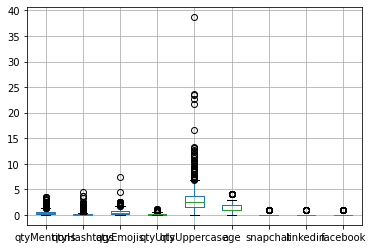

In [ ]:
boxplot = tweet_data.boxplot(column=['qtyMentions', 'qtyHashtags', 'qtyEmojis', 'qtyUrls','qtyUppercase','age','snapchat', 'linkedin', 'facebook' ])

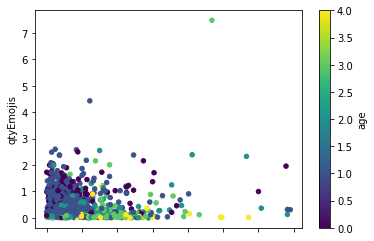

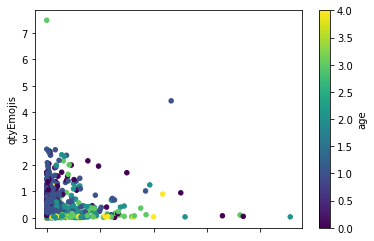

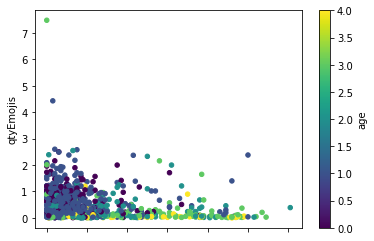

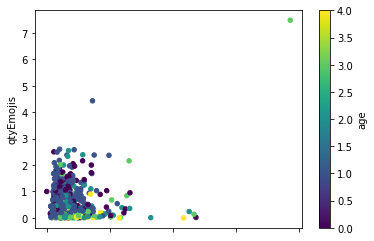

In [ ]:
#Scattering hashtags & emojis
scatter = tweet_data.plot.scatter(x='qtyMentions',
                      y='qtyEmojis',
                      c='age',
                      colormap='viridis')
scatter = tweet_data.plot.scatter(x='qtyHashtags',
                      y='qtyEmojis',
                      c='age',
                      colormap='viridis')
scatter = tweet_data.plot.scatter(x='qtyUrls',
                      y='qtyEmojis',
                      c='age',
                      colormap='viridis')
scatter = tweet_data.plot.scatter(x='qtyUppercase',
                      y='qtyEmojis',
                      c='age',
                      colormap='viridis')

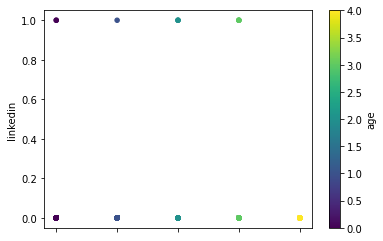

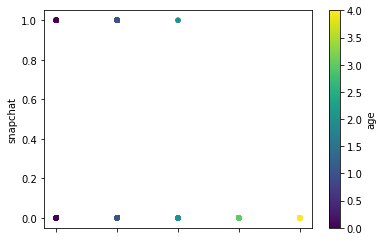

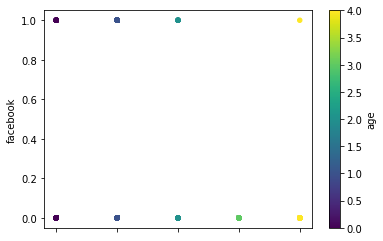

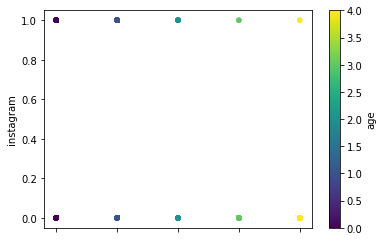

In [ ]:
#Scattering redes sociales
scatter = tweet_data.plot.scatter(x='age',
                      y='linkedin',
                      c='age',
                      colormap='viridis')

scatter = tweet_data.plot.scatter(x='age',
                      y='snapchat',
                      c='age',
                      colormap='viridis')
scatter = tweet_data.plot.scatter(x='age',
                      y='facebook',
                      c='age',
                      colormap='viridis')
scatter = tweet_data.plot.scatter(x='age',
                      y='instagram',
                      c='age',
                      colormap='viridis')



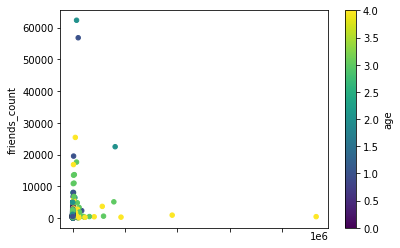

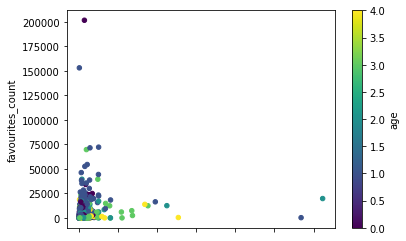

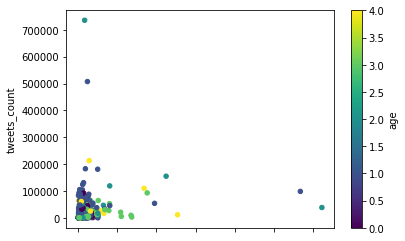

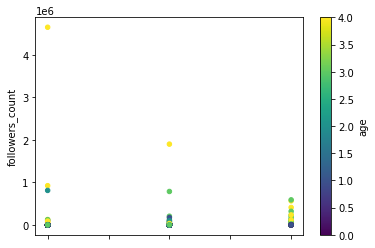

In [ ]:
#Scattering seguidores y amigos
scatter = tweet_data.plot.scatter(x='followers_count',
                      y='friends_count',
                      c='age',
                      colormap='viridis')

scatter = tweet_data.plot.scatter(x='friends_count',
                      y='favourites_count',
                      c='age',
                      colormap='viridis')
scatter = tweet_data.plot.scatter(x='friends_count',
                      y='tweets_count',
                      c='age',
                      colormap='viridis')
scatter = tweet_data.plot.scatter(x='profile_pic_gender',
                      y='followers_count',
                      c='age',
                      colormap='viridis')



In [ ]:
#Conclusiones

#Gracias al profiling y al scattering anterior concluimos que prácticamente nadie tiene linkedin del dataset y es un dato sin utilidad.
#El snapchat está mucho más presente en los primeros 3 rangos etáreos, que incluyen a las personas más jóvenes inclusive hasta los 34.
#Los más jóvenes usan más emojis.
#A partir del rango 35-49 los usuarios hacen más menciones.
#Los hashtags no son tan comunes entre los más jóvenes.
#Los más veteranos comparten mayor cantidad de urls.
#Los más jóvenes presentan una cantidad mayor de tweets.
#Los jóvenes tienen más favoritos en sus tweets.

#Transformaciones

#Cambiamos los rangos de edad por números del 0-4 ("10-17":0, "18-24":1, "25-34" : 2 , "35-49":3, "50-xx":4)
#Sacamos la columna linkedin, casi nadie tiene así que no es un dato que marque un patrón.
#Sacamos la columna screen_names, no aporta mucha información categórica.

In [28]:
#Sacamos columna linkedin, solo 4 lo tienen, no aporta ningún valor.
tweet_data.drop('linkedin', inplace=True, axis=1)
tweet_data.head()

,screen_name,friends_count,tweets_count,snapchat,instagram,facebook,followers_count,favourites_count,qtyMentions,qtyHashtags,qtyUrls,qtyEmojis,qtyUppercase,profile_pic_gender,tweets,age
0,ezequielreal10,659,190,0,0,0,262,1611,0.09,0.04,0.00,2.05,4.18,0,18 del compañero 😌🎉😉. salio algo de play 3🔛😊....,0
1,caamilachaparro,1559,33525,0,0,0,2990,15112,0.56,0.00,0.11,0.73,2.00,2,se fueron las otras así que vuelvo jajajaja. ...,1
2,crisalonsofran,2120,24051,0,0,0,2160,2377,0.82,0.26,0.54,0.31,2.98,2,"¡buen día mundo! ¡buenas noches mundo! ""si no ...",3
3,jluisfoglia,150,4157,0,0,0,98,1128,0.91,0.09,0.21,0.02,23.69,1,cambio juez: sale un bueno para nada y entra ...,0
4,maiikoldadamia,131,1096,0,0,0,189,849,0.20,0.00,0.00,0.75,3.08,1,"creo que ya entre como 20 veces a wsp, a tw y ...",0


In [29]:
tweet_data['tweets'][0]

'18 del compañero  😌🎉😉. salio algo de play 3🔛😊. feliz año nuevo para todos 🤗🎉. hoy mucha pile😊. #feliz navidad para todos los kiero🤗💕. "una persona que ríe a diario no es por que siempre le vaya bien, sino, por que aprendió que debe sonreír en las buenas y en las malas."🍀. la vida por los colores❤ . campeon campeon vamos rojo🏆#17❤. para ser campeonnnnnnnnhoy hay que ganaaár dale dale dale ro🎶🏆. la verdadera amistad no se trata de quién vino primero o de quién te conoce más tiempo; se trata de quién llegó y nunca se fue.🍀. de la mano de holaaaaan la vuelta vamo a dar y dale dale dale roooo😈🏆. echamos un polvo, echamos dos\xa0wow!\xa0tú eres mi diosa y yo soy tu dios😌🔛. vamos por esa copatodo rojo❤🏆. la gente falsa se borra sola.. la vida te va enseñando quién sí, quién no y quién nunca.. que bien che pase a 5to y no me lleve ninguna👌🕇. "hay momentos y personas que no se olvidan". . hay mucho ta te ti pero yo siempre gano🎶. mañana independiente😍😈🎉🏆. no enamorarse, esa es la meta.👌. salii

In [7]:
tweet_data['tweets'][16]

'interesante entrevista  .  temazo, quiero leerla!!. tres anuncios en las afueras. peliculón. tremenda. recomendadísima.. yo misma fui víctima. lo que no explica el artículo es la segunda fase: cuando intentan durante semanas y meses suplantar a apple (con sms al número que das al bloquear el terminal) para que les des tu contraseña del icloud y poder desbloquear el iphone.  . el hilo de twitter, nuevo formato narrativo nativo digital? me recuerda a storify (rip) . "primero me extirparon el derecho: si no, el cáncer podía extenderse. algo más tarde, a los 7 años, el izquierdo"  buena . facebook anuncia un programa europeo de formación y apoyo a startups y a colectivos específicos. tendrá uno de esos centros en españa  . "el tercer paso es el que ha llevado al éxito a \'the new york times\': determinar qué tipo de noticias ha consumido un usuario hasta hacerse suscriptor"  entrevista a  .   ciertamente dudas razonables. identificada la que podría ser la última foto de gerda taro. (cosas

In [8]:
tweet_data['tweets'][48]

'  vamos a alguna pileta jajajajaj. que feliz me hace 😍. amo los sugus , quiero una bolsa llena.  hola yo. que ya sea sábado. que ganas de estar mirando una película acostada, y sin moverme de casa. pero maldito trabajo.  dirección? jajaja.  ya me estoy haciendo fideos.  no hay, tengo hambre. queiro pizza. alguien sabe de algún delivery que esté abierto? tengo hambreeeeeeee. que placer matar a un mosquito y dormir en paz sabiendo que no te zumba más en la oreja... ojalá que funcione, apuesto todo.. tienen una puerta de vidrio con manija pero no, ellos prefieren agarrar del vidrio y ensuciartelo todo..  jajajajajajaja las amo mis amores !!!!. horno microondas tamaño ciudad de zárate, que calor señorrrrrrrr. como le da la cara a la gente para mentirte en la cara y seguir haciendo como si nada pasa? tan verga podés ser?.   jajajajajajajajajaj.  jajajajajaja hola preciosa. un señor yendo a comprar 21:50.. papá date cuenta que nos queremos ir, porque te acordás a último.momento? conchasumad

In [30]:
#Sacamos el screen name, consideramos que tampoco aporta ningún dato.
tweet_data.drop('screen_name', inplace=True, axis=1)
tweet_data.head()

,friends_count,tweets_count,snapchat,instagram,facebook,followers_count,favourites_count,qtyMentions,qtyHashtags,qtyUrls,qtyEmojis,qtyUppercase,profile_pic_gender,tweets,age
0,659,190,0,0,0,262,1611,0.09,0.04,0.00,2.05,4.18,0,18 del compañero 😌🎉😉. salio algo de play 3🔛😊....,0
1,1559,33525,0,0,0,2990,15112,0.56,0.00,0.11,0.73,2.00,2,se fueron las otras así que vuelvo jajajaja. ...,1
2,2120,24051,0,0,0,2160,2377,0.82,0.26,0.54,0.31,2.98,2,"¡buen día mundo! ¡buenas noches mundo! ""si no ...",3
3,150,4157,0,0,0,98,1128,0.91,0.09,0.21,0.02,23.69,1,cambio juez: sale un bueno para nada y entra ...,0
4,131,1096,0,0,0,189,849,0.20,0.00,0.00,0.75,3.08,1,"creo que ya entre como 20 veces a wsp, a tw y ...",0


In [31]:
from sklearn.model_selection import train_test_split
from nltk.stem.snowball import SpanishStemmer
stemmer = SpanishStemmer()

#Tomamos una muestra para trabajar más rápido.
tweet_data_sample = tweet_data.head(30)

#Stemming
def stemming (text):
    return ' '.join([stemmer.stem(word) for word in text.split()])

tweet_data_sample['tweets'] = tweet_data_sample['tweets'].apply(stemming)




/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


In [32]:
tweet_data_sample['tweets'].head()

0    18 del compañer 😌🎉😉. sali algo de play 3🔛😊. fe...
1    se fueron las otras asi que vuelv jajajaja. no...
2    ¡bu dia mundo! ¡buen noch mundo! "si no constr...
3    cambi juez: sal un buen par nad y entra un inu...
4    cre que ya entre com 20 vec a wsp, a tw y a ig...
Name: tweets, dtype: object

In [33]:
from nltk.corpus import stopwords
import string

import nltk
nltk.download('stopwords')

def remove_punctuation_and_stopwords(message):
    
    message_no_punctuation = [ch for ch in message if ch not in string.punctuation]
    message_no_punctuation = "".join(message_no_punctuation).split()
    
    message_no_punctuation_no_stopwords = \
        [word.lower() for word in message_no_punctuation if word.lower() not in stopwords.words("spanish")]
        
    return message_no_punctuation_no_stopwords


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [34]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.model_selection import train_test_split
from scipy.sparse import  hstack

#Baseline:

#Tweet vectorization

vectorizer= CountVectorizer(analyzer = remove_punctuation_and_stopwords, max_features=50)
vectorized_values = vectorizer.fit_transform(tweet_data_sample['tweets'])
vectorized_values.shape

#TfIdf

tfidf_transformer = TfidfTransformer().fit(vectorized_values)
data_tfidf = tfidf_transformer.transform(vectorized_values)
data_tfidf
np.shape(data_tfidf)

#Train test split

data_tfidf_train, data_tfidf_test, label_train, label_test = \
    train_test_split(data_tfidf, tweet_data_sample["age"], test_size=0.3, random_state=5)

data_tfidf_train
data_tfidf_test

# K-Fold Cross Validation - Bagging with KNN
#Classifiers

#KNN
parameters_KNN = {'n_neighbors': (3,6,8), }

KNN = GridSearchCV( KNeighborsClassifier(), parameters_KNN, cv=5,
                        n_jobs=-1, verbose=1)
KNN.fit(data_tfidf_train, label_train)
print(KNN.best_params_)
print(KNN.best_score_)

#KNN con tfidf con stemming previo parece ser un buen estimador, siendo la accuracy score 0.73.


Fitting 5 folds for each of 3 candidates, totalling 15 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


{'n_neighbors': 3}
0.73


[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    1.3s finished


In [42]:
#RandomForest
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC

#tweet_data_sample['tweets'] = vectorized_values

#x_train, x_test, y_train, y_test = train_test_split(tweet_data_sample, tweet_data_sample["age"], test_size=0.3, random_state=42)
rfc=RandomForestClassifier(random_state=42)
param_grid = { 
    'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
CV_rfc.fit(data_tfidf_train, label_train)
CV_rfc.best_params_

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


{'criterion': 'gini',
 'max_depth': 4,
 'max_features': 'auto',
 'n_estimators': 200}

In [45]:
rfc1=RandomForestClassifier(random_state=42, max_features='auto', n_estimators= 200, max_depth=4, criterion='gini')
rfc1.fit(data_tfidf_train, label_train)
pred=rfc1.predict(data_tfidf_test)
print("Accuracy for Random Forest : ",accuracy_score(label_test,pred))

Accuracy for Random Forest :  0.5555555555555556


In [ ]:
#Random forest es un peor clasificador para el modelo actual.
#Procedemos a seguir estudiando los atributos para mejorar el resultado de la baseline.